In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from google.colab import drive
import glob
import subprocess
import os

In [ ]:
# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Clone the Darknet repository
!git clone https://github.com/AlexeyAB/darknet

# Change the directory to darknet
%cd darknet

# Modify the Makefile to enable GPU, CUDNN, and OPENCV
!sed -i 's/OPENCV=0/OPENCV=1/' Makefile
!sed -i 's/GPU=0/GPU=1/' Makefile
!sed -i 's/CUDNN=0/CUDNN=1/' Makefile
!sed -i 's/CUDNN_HALF=0/CUDNN_HALF=1/' Makefile
!sed -i 's/LIBSO=0/LIBSO=1/' Makefile

# Compile the darknet
!make

#!wget https://github.com/AlexeyAB/darknet/releases/download/darknet_yolo_v3_optimal/yolov4.conv.137

Cloning into 'darknet'...
remote: Enumerating objects: 15851, done.
remote: Counting objects: 100% (18/18), done.
remote: Compressing objects: 100% (14/14), done.
remote: Total 15851 (delta 5), reused 11 (delta 4), pack-reused 15833 (from 1)
Receiving objects: 100% (15851/15851), 14.42 MiB | 14.16 MiB/s, done.
Resolving deltas: 100% (10671/10671), done.
/content/darknet
mkdir -p ./obj/
mkdir -p backup
mkdir -p results
chmod +x *.sh
g++ -std=c++11 -std=c++11 -Iinclude/ -I3rdparty/stb/include -DOPENCV `pkg-config --cflags opencv4 2> /dev/null || pkg-config --cflags opencv` -DGPU -I/usr/local/cuda/include/ -DCUDNN -DCUDNN_HALF -Wall -Wfatal-errors -Wno-unused-result -Wno-unknown-pragmas -fPIC -rdynamic -Ofast -DOPENCV -DGPU -DCUDNN -I/usr/local/cudnn/include -DCUDNN_HALF -fPIC -c ./src/image_opencv.cpp -o obj/image_opencv.o
./src/image_opencv.cpp: In function ‘void draw_detections_cv_v3(void**, detection*, int, float, char**, image**, int, int)’:
./src/image_opencv.cpp:945:23: warning: va

# **Preparation of the dataset and files**

In [ ]:
train_images_path = '/content/drive/MyDrive/Final_Project/datasetYolo/train/images'

test_images_path = '/content/drive/MyDrive/Final_Project/datasetYolo/test/images'



# Get all image paths
train_images = glob.glob(train_images_path + '/*.jpg')
test_images = glob.glob(test_images_path + '/*.jpg')

# Write paths to train.txt
with open('/content/drive/MyDrive/Final_Project/yoloFiles/train.txt', 'w') as f:
    f.write('\n'.join(train_images))

# Write paths to valid.txt
with open('/content/drive/MyDrive/Final_Project/yoloFiles/valid.txt', 'w') as f:
    f.write('\n'.join(test_images))

with open('/content/drive/MyDrive/Final_Project/yoloFiles/obj.names', 'w') as f:
    f.write('smoke\nfire\n')

with open('/content/drive/MyDrive/Final_Project/yoloFiles/obj.data', 'w') as f:
    f.write('classes = 2\n')
    f.write('train = /content/drive/MyDrive/Final_Project/yoloFiles/train.txt\n')
    f.write('valid = /content/drive/MyDrive/Final_Project/yoloFiles/valid.txt\n')
    f.write('names = /content/drive/MyDrive/Final_Project/yoloFiles/obj.names\n')
    f.write('backup = backup/\n')


## **Config file**

In [ ]:
config_content = """
[net]
batch=1
subdivisions=1
# if training:
# batch=64
# subdivisions=16
# Training
#width=512
#height=512
width=608
height=608
channels=3
momentum=0.949
decay=0.0005
angle=0
saturation = 1.5
exposure = 1.5
hue=.1

learning_rate=0.0013
burn_in=1000
max_batches = 4000
policy=steps
steps=3200,3600
scales=.1,.1

#cutmix=1
mosaic=1

#:104x104 54:52x52 85:26x26 104:13x13 for 416

[convolutional]
batch_normalize=1
filters=32
size=3
stride=1
pad=1
activation=mish

# Downsample

[convolutional]
batch_normalize=1
filters=64
size=3
stride=2
pad=1
activation=mish

[convolutional]
batch_normalize=1
filters=64
size=1
stride=1
pad=1
activation=mish

[route]
layers = -2

[convolutional]
batch_normalize=1
filters=64
size=1
stride=1
pad=1
activation=mish

[convolutional]
batch_normalize=1
filters=32
size=1
stride=1
pad=1
activation=mish

[convolutional]
batch_normalize=1
filters=64
size=3
stride=1
pad=1
activation=mish

[shortcut]
from=-3
activation=linear

[convolutional]
batch_normalize=1
filters=64
size=1
stride=1
pad=1
activation=mish

[route]
layers = -1,-7

[convolutional]
batch_normalize=1
filters=64
size=1
stride=1
pad=1
activation=mish

# Downsample

[convolutional]
batch_normalize=1
filters=128
size=3
stride=2
pad=1
activation=mish

[convolutional]
batch_normalize=1
filters=64
size=1
stride=1
pad=1
activation=mish

[route]
layers = -2

[convolutional]
batch_normalize=1
filters=64
size=1
stride=1
pad=1
activation=mish

[convolutional]
batch_normalize=1
filters=64
size=1
stride=1
pad=1
activation=mish

[convolutional]
batch_normalize=1
filters=64
size=3
stride=1
pad=1
activation=mish

[shortcut]
from=-3
activation=linear

[convolutional]
batch_normalize=1
filters=64
size=1
stride=1
pad=1
activation=mish

[convolutional]
batch_normalize=1
filters=64
size=3
stride=1
pad=1
activation=mish

[shortcut]
from=-3
activation=linear

[convolutional]
batch_normalize=1
filters=64
size=1
stride=1
pad=1
activation=mish

[route]
layers = -1,-10

[convolutional]
batch_normalize=1
filters=128
size=1
stride=1
pad=1
activation=mish

# Downsample

[convolutional]
batch_normalize=1
filters=256
size=3
stride=2
pad=1
activation=mish

[convolutional]
batch_normalize=1
filters=128
size=1
stride=1
pad=1
activation=mish

[route]
layers = -2

[convolutional]
batch_normalize=1
filters=128
size=1
stride=1
pad=1
activation=mish

[convolutional]
batch_normalize=1
filters=128
size=1
stride=1
pad=1
activation=mish

[convolutional]
batch_normalize=1
filters=128
size=3
stride=1
pad=1
activation=mish

[shortcut]
from=-3
activation=linear

[convolutional]
batch_normalize=1
filters=128
size=1
stride=1
pad=1
activation=mish

[convolutional]
batch_normalize=1
filters=128
size=3
stride=1
pad=1
activation=mish

[shortcut]
from=-3
activation=linear

[convolutional]
batch_normalize=1
filters=128
size=1
stride=1
pad=1
activation=mish

[convolutional]
batch_normalize=1
filters=128
size=3
stride=1
pad=1
activation=mish

[shortcut]
from=-3
activation=linear

[convolutional]
batch_normalize=1
filters=128
size=1
stride=1
pad=1
activation=mish

[convolutional]
batch_normalize=1
filters=128
size=3
stride=1
pad=1
activation=mish

[shortcut]
from=-3
activation=linear


[convolutional]
batch_normalize=1
filters=128
size=1
stride=1
pad=1
activation=mish

[convolutional]
batch_normalize=1
filters=128
size=3
stride=1
pad=1
activation=mish

[shortcut]
from=-3
activation=linear

[convolutional]
batch_normalize=1
filters=128
size=1
stride=1
pad=1
activation=mish

[convolutional]
batch_normalize=1
filters=128
size=3
stride=1
pad=1
activation=mish

[shortcut]
from=-3
activation=linear

[convolutional]
batch_normalize=1
filters=128
size=1
stride=1
pad=1
activation=mish

[convolutional]
batch_normalize=1
filters=128
size=3
stride=1
pad=1
activation=mish

[shortcut]
from=-3
activation=linear

[convolutional]
batch_normalize=1
filters=128
size=1
stride=1
pad=1
activation=mish

[convolutional]
batch_normalize=1
filters=128
size=3
stride=1
pad=1
activation=mish

[shortcut]
from=-3
activation=linear

[convolutional]
batch_normalize=1
filters=128
size=1
stride=1
pad=1
activation=mish

[route]
layers = -1,-28

[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=mish

# Downsample

[convolutional]
batch_normalize=1
filters=512
size=3
stride=2
pad=1
activation=mish

[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=mish

[route]
layers = -2

[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=mish

[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=mish

[convolutional]
batch_normalize=1
filters=256
size=3
stride=1
pad=1
activation=mish

[shortcut]
from=-3
activation=linear


[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=mish

[convolutional]
batch_normalize=1
filters=256
size=3
stride=1
pad=1
activation=mish

[shortcut]
from=-3
activation=linear


[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=mish

[convolutional]
batch_normalize=1
filters=256
size=3
stride=1
pad=1
activation=mish

[shortcut]
from=-3
activation=linear


[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=mish

[convolutional]
batch_normalize=1
filters=256
size=3
stride=1
pad=1
activation=mish

[shortcut]
from=-3
activation=linear


[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=mish

[convolutional]
batch_normalize=1
filters=256
size=3
stride=1
pad=1
activation=mish

[shortcut]
from=-3
activation=linear


[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=mish

[convolutional]
batch_normalize=1
filters=256
size=3
stride=1
pad=1
activation=mish

[shortcut]
from=-3
activation=linear


[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=mish

[convolutional]
batch_normalize=1
filters=256
size=3
stride=1
pad=1
activation=mish

[shortcut]
from=-3
activation=linear

[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=mish

[convolutional]
batch_normalize=1
filters=256
size=3
stride=1
pad=1
activation=mish

[shortcut]
from=-3
activation=linear

[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=mish

[route]
layers = -1,-28

[convolutional]
batch_normalize=1
filters=512
size=1
stride=1
pad=1
activation=mish

# Downsample

[convolutional]
batch_normalize=1
filters=1024
size=3
stride=2
pad=1
activation=mish

[convolutional]
batch_normalize=1
filters=512
size=1
stride=1
pad=1
activation=mish

[route]
layers = -2

[convolutional]
batch_normalize=1
filters=512
size=1
stride=1
pad=1
activation=mish

[convolutional]
batch_normalize=1
filters=512
size=1
stride=1
pad=1
activation=mish

[convolutional]
batch_normalize=1
filters=512
size=3
stride=1
pad=1
activation=mish

[shortcut]
from=-3
activation=linear

[convolutional]
batch_normalize=1
filters=512
size=1
stride=1
pad=1
activation=mish

[convolutional]
batch_normalize=1
filters=512
size=3
stride=1
pad=1
activation=mish

[shortcut]
from=-3
activation=linear

[convolutional]
batch_normalize=1
filters=512
size=1
stride=1
pad=1
activation=mish

[convolutional]
batch_normalize=1
filters=512
size=3
stride=1
pad=1
activation=mish

[shortcut]
from=-3
activation=linear

[convolutional]
batch_normalize=1
filters=512
size=1
stride=1
pad=1
activation=mish

[convolutional]
batch_normalize=1
filters=512
size=3
stride=1
pad=1
activation=mish

[shortcut]
from=-3
activation=linear

[convolutional]
batch_normalize=1
filters=512
size=1
stride=1
pad=1
activation=mish

[route]
layers = -1,-16

[convolutional]
batch_normalize=1
filters=1024
size=1
stride=1
pad=1
activation=mish

##########################

[convolutional]
batch_normalize=1
filters=512
size=1
stride=1
pad=1
activation=leaky

[convolutional]
batch_normalize=1
size=3
stride=1
pad=1
filters=1024
activation=leaky

[convolutional]
batch_normalize=1
filters=512
size=1
stride=1
pad=1
activation=leaky

### SPP ###
[maxpool]
stride=1
size=5

[route]
layers=-2

[maxpool]
stride=1
size=9

[route]
layers=-4

[maxpool]
stride=1
size=13

[route]
layers=-1,-3,-5,-6
### End SPP ###

[convolutional]
batch_normalize=1
filters=512
size=1
stride=1
pad=1
activation=leaky

[convolutional]
batch_normalize=1
size=3
stride=1
pad=1
filters=1024
activation=leaky

[convolutional]
batch_normalize=1
filters=512
size=1
stride=1
pad=1
activation=leaky

[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=leaky

[upsample]
stride=2

[route]
layers = 85

[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=leaky

[route]
layers = -1, -3

[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=leaky

[convolutional]
batch_normalize=1
size=3
stride=1
pad=1
filters=512
activation=leaky

[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=leaky

[convolutional]
batch_normalize=1
size=3
stride=1
pad=1
filters=512
activation=leaky

[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=leaky

[convolutional]
batch_normalize=1
filters=128
size=1
stride=1
pad=1
activation=leaky

[upsample]
stride=2

[route]
layers = 54

[convolutional]
batch_normalize=1
filters=128
size=1
stride=1
pad=1
activation=leaky

[route]
layers = -1, -3

[convolutional]
batch_normalize=1
filters=128
size=1
stride=1
pad=1
activation=leaky

[convolutional]
batch_normalize=1
size=3
stride=1
pad=1
filters=256
activation=leaky

[convolutional]
batch_normalize=1
filters=128
size=1
stride=1
pad=1
activation=leaky

[convolutional]
batch_normalize=1
size=3
stride=1
pad=1
filters=256
activation=leaky

[convolutional]
batch_normalize=1
filters=128
size=1
stride=1
pad=1
activation=leaky

##########################

[convolutional]
batch_normalize=1
size=3
stride=1
pad=1
filters=256
activation=leaky

[convolutional]
size=1
stride=1
pad=1
filters=21
activation=linear


[yolo]
mask = 0,1,2
anchors = 12, 16, 19, 36, 40, 28, 36, 75, 76, 55, 72, 146, 142, 110, 192, 243, 459, 401
classes=2
num=9
jitter=.3
ignore_thresh = .7
truth_thresh = 1
scale_x_y = 1.2
iou_thresh=0.213
cls_normalizer=1.0
iou_normalizer=0.07
iou_loss=ciou
nms_kind=greedynms
beta_nms=0.6
max_delta=5


[route]
layers = -4

[convolutional]
batch_normalize=1
size=3
stride=2
pad=1
filters=256
activation=leaky

[route]
layers = -1, -16

[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=leaky

[convolutional]
batch_normalize=1
size=3
stride=1
pad=1
filters=512
activation=leaky

[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=leaky

[convolutional]
batch_normalize=1
size=3
stride=1
pad=1
filters=512
activation=leaky

[convolutional]
batch_normalize=1
filters=256
size=1
stride=1
pad=1
activation=leaky

[convolutional]
batch_normalize=1
size=3
stride=1
pad=1
filters=512
activation=leaky

[convolutional]
size=1
stride=1
pad=1
filters=21
activation=linear


[yolo]
mask = 3,4,5
anchors = 12, 16, 19, 36, 40, 28, 36, 75, 76, 55, 72, 146, 142, 110, 192, 243, 459, 401
classes=2
num=9
jitter=.3
ignore_thresh = .7
truth_thresh = 1
scale_x_y = 1.1
iou_thresh=0.213
cls_normalizer=1.0
iou_normalizer=0.07
iou_loss=ciou
nms_kind=greedynms
beta_nms=0.6
max_delta=5


[route]
layers = -4

[convolutional]
batch_normalize=1
size=3
stride=2
pad=1
filters=512
activation=leaky

[route]
layers = -1, -37

[convolutional]
batch_normalize=1
filters=512
size=1
stride=1
pad=1
activation=leaky

[convolutional]
batch_normalize=1
size=3
stride=1
pad=1
filters=1024
activation=leaky

[convolutional]
batch_normalize=1
filters=512
size=1
stride=1
pad=1
activation=leaky

[convolutional]
batch_normalize=1
size=3
stride=1
pad=1
filters=1024
activation=leaky

[convolutional]
batch_normalize=1
filters=512
size=1
stride=1
pad=1
activation=leaky

[convolutional]
batch_normalize=1
size=3
stride=1
pad=1
filters=1024
activation=leaky

[convolutional]
size=1
stride=1
pad=1
filters=21
activation=linear


[yolo]
mask = 6,7,8
anchors = 12, 16, 19, 36, 40, 28, 36, 75, 76, 55, 72, 146, 142, 110, 192, 243, 459, 401
classes=2
num=9
jitter=.3
ignore_thresh = .7
truth_thresh = 1
random=1
scale_x_y = 1.05
iou_thresh=0.213
cls_normalizer=1.0
iou_normalizer=0.07
iou_loss=ciou
nms_kind=greedynms
beta_nms=0.6
max_delta=5
"""

with open('/content/drive/MyDrive/Final_Project/yoloFiles/yolov4-obj.cfg', 'w') as f:
    f.write(config_content)

# **Train the YOLOv4**

In [ ]:
# Download the pre-trained YOLOv4 weights
#!wget https://github.com/AlexeyAB/darknet/releases/download/yolov4/yolov4.weights


!./darknet detector train /content/drive/MyDrive/Final_Project/yoloFiles/obj.data /content/drive/MyDrive/Final_Project/yoloFiles/yolov4-obj.cfg yolov4.conv.137 -dont_show

Streaming output truncated to the last 5000 lines.
v3 (iou loss, Normalizer: (iou: 0.07, obj: 1.00, cls: 1.00) Region 161 Avg (IOU: 0.847257), count: 10, class_loss = 1.051041, iou_loss = 2.617458, total_loss = 3.668499 
 total_bbox = 1562338, rewritten_bbox = 0.505524 % 
v3 (iou loss, Normalizer: (iou: 0.07, obj: 1.00, cls: 1.00) Region 139 Avg (IOU: 0.776181), count: 11, class_loss = 1.493477, iou_loss = 66.706337, total_loss = 68.199814 
v3 (iou loss, Normalizer: (iou: 0.07, obj: 1.00, cls: 1.00) Region 150 Avg (IOU: 0.789647), count: 14, class_loss = 2.290097, iou_loss = 24.068083, total_loss = 26.358179 
v3 (iou loss, Normalizer: (iou: 0.07, obj: 1.00, cls: 1.00) Region 161 Avg (IOU: 0.817561), count: 8, class_loss = 1.500223, iou_loss = 2.725589, total_loss = 4.225811 
 total_bbox = 1562371, rewritten_bbox = 0.505514 % 
v3 (iou loss, Normalizer: (iou: 0.07, obj: 1.00, cls: 1.00) Region 139 Avg (IOU: 0.661515), count: 3, class_loss = 0.745404, iou_loss = 18.551065, total_loss = 19

# **Detect fire**

In [ ]:
import re
import matplotlib.pyplot as plt
from PIL import Image

def extract_bounding_boxes(text):
    pattern = r'\(left_x:\s*(\d+)\s+top_y:\s*(\d+)\s+width:\s*(\d+)\s+height:\s*(\d+)\)'
    matches = re.findall(pattern, text)
    bounding_boxes = []
    for match in matches:
        left_x = int(match[0])
        top_y = int(match[1])
        width = int(match[2])
        height = int(match[3])
        bounding_boxes.append((left_x, top_y, width, height))
    return bounding_boxes

def crop_image(input_image_path, output_image_path, bbox):

    left_x, top_y, width, height = bbox

    right_x = left_x + width
    bottom_y = top_y + height

    image = Image.open(input_image_path)

    cropped_image = image.crop((left_x, top_y, right_x, bottom_y))

    cropped_image.save(output_image_path)


## **Detect fire by darknet**

 CUDNN_HALF=1 
net.optimized_memory = 0 
mini_batch = 1, batch = 1, time_steps = 1, train = 0 
Create CUDA-stream - 0 
 Create cudnn-handle 0 
nms_kind: greedynms (1), beta = 0.600000 
nms_kind: greedynms (1), beta = 0.600000 
nms_kind: greedynms (1), beta = 0.600000 

 seen 64, trained: 256 K-images (4 Kilo-batches_64) 
 Detection layer: 139 - type = 28 
 Detection layer: 150 - type = 28 
 Detection layer: 161 - type = 28 
/content/drive/MyDrive/datasetUnet/Images/image_8.jpg: Predicted in 136.256000 milli-seconds.
fire: 69%	(left_x: 2076   top_y:  310   width:  330   height:  243)
fire: 36%	(left_x: 2941   top_y:  442   width:  103   height:   59)
fire: 42%	(left_x: 3559   top_y:  404   width:   88   height:   55)



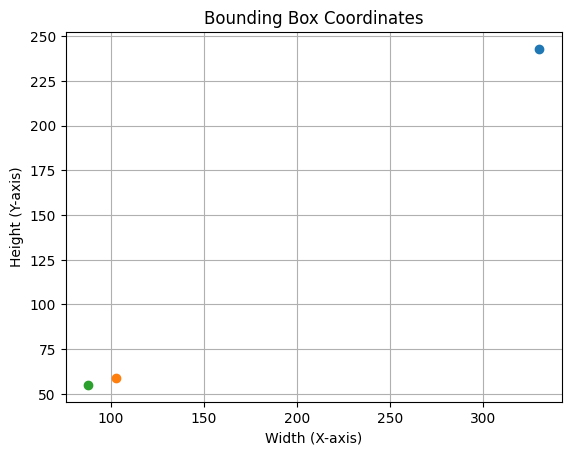

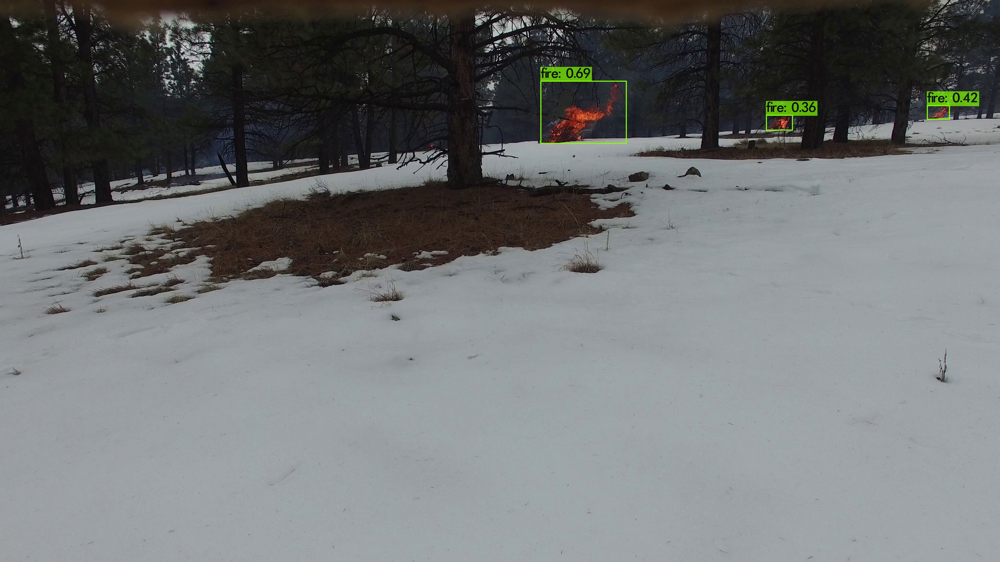

In [ ]:

# Define the paths
data_file = '/content/drive/MyDrive/Final_Project/yoloFiles/obj.data'
cfg_file = '/content/drive/MyDrive/Final_Project/yoloFiles/yolov4-obj.cfg'
weights_file = '/content/drive/MyDrive/Final_Project/yoloFiles/yolov4-obj.weights'
image_file = '/content/drive/MyDrive/datasetUnet/Images/image_8.jpg'

# Define the command
command = [
    './darknet', 'detector', 'test',
    data_file,
    cfg_file,
    weights_file,
    '-ext_output', image_file
]

# Run the command and capture the output
result = subprocess.run(command, capture_output=True, text=True)

# The output will be in result.stdout
output = result.stdout

# Print or process the output
print(output)

# Display the image with detections
detected_image_path = 'predictions.jpg'  # Darknet typically saves the result as 'predictions.jpg'

# Load the detected image
detected_image = cv2.imread(detected_image_path)

# Check if the image was loaded successfully
if detected_image is not None:
    # Display the image

    bboxes = extract_bounding_boxes(output)

    plt.figure()
    for bbox in bboxes:
        left_x, top_y, width, height = bbox
        points_x = [width]
        points_y = [height]
        plt.plot(points_x, points_y, marker='o')

    plt.xlabel('Width (X-axis)')
    plt.ylabel('Height (Y-axis)')
    plt.title('Bounding Box Coordinates')
    plt.grid(True)
    plt.show()
    cv2_imshow(detected_image)
else:
    print("Error: Detected image not found.")

## **Detect fire by cv2**

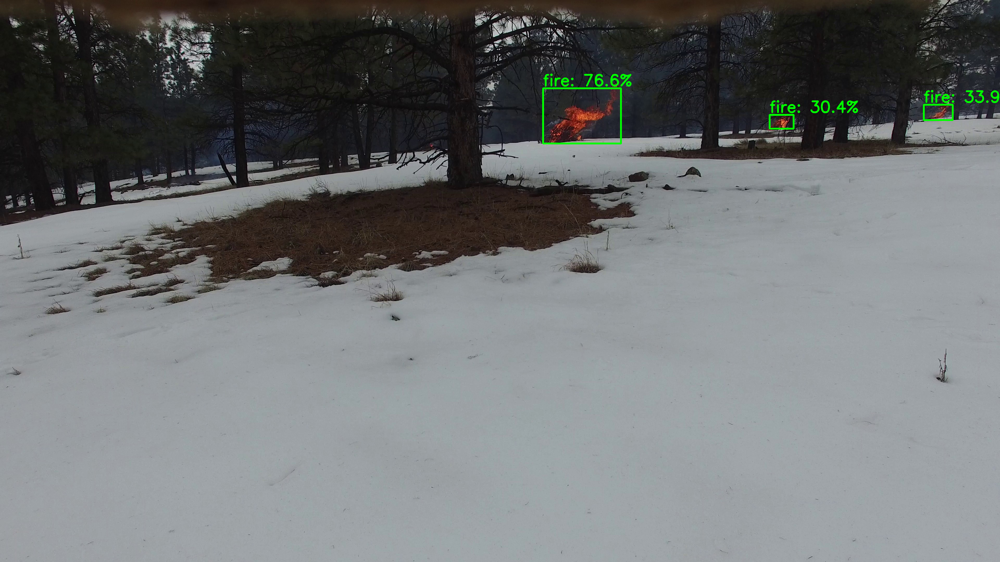

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load YOLO
net = cv2.dnn.readNet("/content/drive/MyDrive/Final_Project/yoloFiles/yolov4-obj.weights",
                      "/content/drive/MyDrive/Final_Project/yoloFiles/yolov4-obj.cfg")
with open("/content/drive/MyDrive/Final_Project/yoloFiles/obj.names", "r") as f:
    classes = [line.strip() for line in f.readlines()]

# Get the names of all layers in the network
layer_names = net.getLayerNames()

# Get the names of the output layers, i.e., the layers responsible for detection
output_layer_indices = net.getUnconnectedOutLayers()  # Get the indices of the output layers
output_layers = [layer_names[i - 1] for i in output_layer_indices]  # Adjust for zero-based indexing

# Load image
image_path = "/content/drive/MyDrive/datasetUnet/Images/image_8.jpg"
img = cv2.imread(image_path)
height, width, channels = img.shape

# Detecting objects
blob = cv2.dnn.blobFromImage(img, 0.00392, (416, 416), (0, 0, 0), True, crop=False)
net.setInput(blob)
outs = net.forward(output_layers)

# Showing information on the screen
class_ids = []
confidences = []
boxes = []
for out in outs:
    for detection in out:
        scores = detection[5:]
        class_id = np.argmax(scores)
        confidence = scores[class_id]

        if confidence > 0.2:
            # Object detected
            center_x = int(detection[0] * width)
            center_y = int(detection[1] * height)
            w = int(detection[2] * width)
            h = int(detection[3] * height)

            # Rectangle coordinates
            x = int(center_x - w / 2)
            y = int(center_y - h / 2)

            boxes.append([x, y, w, h])
            confidences.append(float(confidence))
            class_ids.append(class_id)

indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.2, 0.3)

for i in range(len(boxes)):
    if i in indexes:
        x, y, w, h = boxes[i]
        label = str(classes[class_ids[i]])
        confidence = confidences[i]
        color = (0, 255, 0)
        cv2.rectangle(img, (x, y), (x + w, y + h), color, 5)
        cv2.putText(img, label+f": {confidence*100:.1f}%", (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 2, color, 5)

# Save and show the output image
output_path = "/content/output_image.jpg"
cv2.imwrite(output_path, img)
cv2_imshow(img)
cv2.waitKey(0)
cv2.destroyAllWindows()
